In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import MeanShift , estimate_bandwidth, SpectralClustering , AgglomerativeClustering
from sklearn.mixture import GaussianMixture

In [2]:
# importing file
df_data=pd.read_csv(r"C:/Users/AnaLúciaLima/Downloads/SAD_filtered_data.csv",index_col=0)
df_data.head()

,First Policy´s Year,Customer Age,Educational Degree,Gross Monthly Salary,Geographic Living Area,Children,Customer Monetary Value,Claims Rate,Premiums in LOB: Motor,Premiums in LOB: Household,Premiums in LOB: Health,Premiums in LOB: Life,Premiums in LOB: Work Compensations
Customer Identity,,,,,,,,,,,,,
1,1985.0,34.0,2,4354.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1981.0,21.0,2,1353.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991.0,46.0,1,4554.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1990.0,35.0,3,2197.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986.0,43.0,3,3526.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [3]:
print('Shape: ', df_data.shape)
df_data.info()

Shape:  (10074, 13)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 10074 entries, 1 to 10296
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   First Policy´s Year                  10074 non-null  float64
 1   Customer Age                         10074 non-null  float64
 2   Educational Degree                   10074 non-null  int64  
 3   Gross Monthly Salary                 10074 non-null  float64
 4   Geographic Living Area               10074 non-null  float64
 5   Children                             10074 non-null  float64
 6   Customer Monetary Value              10074 non-null  float64
 7   Claims Rate                          10074 non-null  float64
 8   Premiums in LOB: Motor               10074 non-null  float64
 9   Premiums in LOB: Household           10074 non-null  float64
 10  Premiums in LOB: Health              10074 non-null  float64
 11  Premiums

In [4]:
df_data.describe()

,First Policy´s Year,Customer Age,Educational Degree,Gross Monthly Salary,Geographic Living Area,Children,Customer Monetary Value,Claims Rate,Premiums in LOB: Motor,Premiums in LOB: Household,Premiums in LOB: Health,Premiums in LOB: Life,Premiums in LOB: Work Compensations
count,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000,10074.000000
mean,1986.027397,48.076137,2.487592,5013.316855,2.711932,0.706869,209.969136,0.684149,298.286140,199.600025,167.177314,41.239996,40.247157
std,6.607040,17.284500,0.790904,1958.568516,1.266214,0.455221,241.469795,0.316312,137.744057,220.543079,74.178357,47.348191,46.537225
min,1974.000000,15.000000,1.000000,665.000000,1.000000,0.000000,-490.200000,0.000000,-4.110000,-75.000000,-2.110000,-7.000000,-12.000000
25%,1980.000000,33.000000,2.000000,3444.000000,1.000000,0.000000,-10.082500,0.400000,193.397500,49.450000,111.215000,9.780000,9.890000
50%,1986.000000,48.000000,3.000000,5022.500000,3.000000,1.000000,184.930000,0.720000,300.390000,132.250000,162.810000,24.670000,25.450000
75%,1992.000000,63.000000,3.000000,6585.750000,4.000000,1.000000,394.947500,0.980000,408.492500,284.500000,218.930000,56.900000,55.120000
max,1998.000000,81.000000,4.000000,10042.000000,4.000000,1.000000,1010.740000,1.550000,585.220000,2223.750000,380.740000,398.300000,494.100000


In [5]:
X=df_data

In [6]:
# Remover variável 'Claims Rate'
X = X.drop(['Claims Rate'], axis=1)
X.head()

,First Policy´s Year,Customer Age,Educational Degree,Gross Monthly Salary,Geographic Living Area,Children,Customer Monetary Value,Premiums in LOB: Motor,Premiums in LOB: Household,Premiums in LOB: Health,Premiums in LOB: Life,Premiums in LOB: Work Compensations
Customer Identity,,,,,,,,,,,,
1,1985.0,34.0,2,4354.0,1.0,1.0,380.97,375.85,79.45,146.36,47.01,16.89
2,1981.0,21.0,2,1353.0,4.0,1.0,-131.13,77.46,416.20,116.69,194.48,106.13
3,1991.0,46.0,1,4554.0,3.0,0.0,504.67,206.15,224.50,124.58,86.35,99.02
4,1990.0,35.0,3,2197.0,4.0,1.0,-16.99,182.48,43.35,311.17,35.34,28.34
5,1986.0,43.0,3,3526.0,4.0,1.0,35.23,338.62,47.80,182.59,18.78,41.45


## PCA - Redução da dimensionalidade

In [7]:
# Standardizing the features
X = StandardScaler().fit_transform(X)
X

array([[-0.1555081 , -0.81441956, -0.61653027, ..., -0.28065258,
         0.12186929, -0.50192757],
       [-0.76095299, -1.56657582, -0.61653027, ..., -0.68065433,
         3.23660963,  1.41577228],
       [ 0.75265922, -0.12012147, -1.88096959, ..., -0.57428379,
         0.95277649,  1.26298378],
       ...,
       [ 1.20674289, -0.46727052,  0.64790905, ..., -0.33606233,
        -0.60343201, -0.75979846],
       [-0.76095299, -0.52512869, -1.88096959, ...,  0.42053013,
         0.47860601,  1.56146933],
       [ 0.601298  , -0.75656139,  1.91234837, ..., -0.34954402,
        -0.72551243, -0.58788454]])

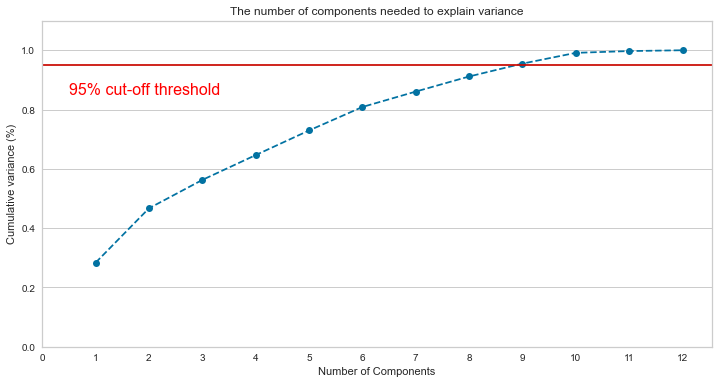

In [8]:
pca = PCA().fit(X)


import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 13, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 13, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.savefig('number_of_components')
plt.show()

Variação capturada em cada componente principal:
A maior parte da variação é colocada no primeiro componente. O que resta é colocado no componente 2, depois no componente 3, etc.

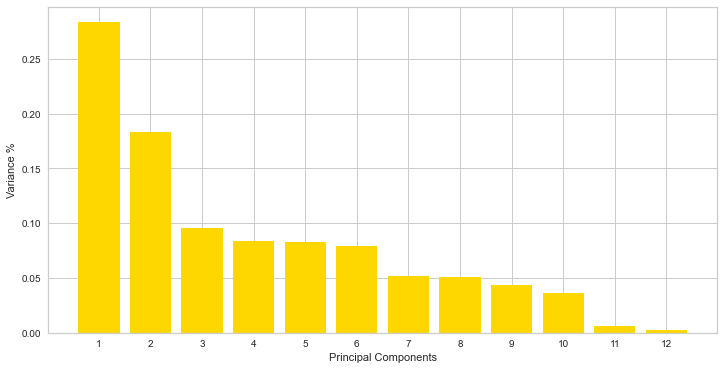

In [10]:
# Plotting the variances for each Principal Components

PC = range(1, pca.n_components_+1)
plt.bar(PC, pca.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC)
plt.savefig('variance')
plt.show()

In [11]:
pca_reducer = PCA(n_components=9)
reduced_data = pca_reducer.fit_transform(X)


# Putting components in a dataframe for later
PCA_components = pd.DataFrame(reduced_data, columns=(["PC1","PC2", "PC3", "PC4", "PC5", "PC6", "PC7","PC8","PC9"]))
reduced_data = pd.DataFrame(data = reduced_data)
                              

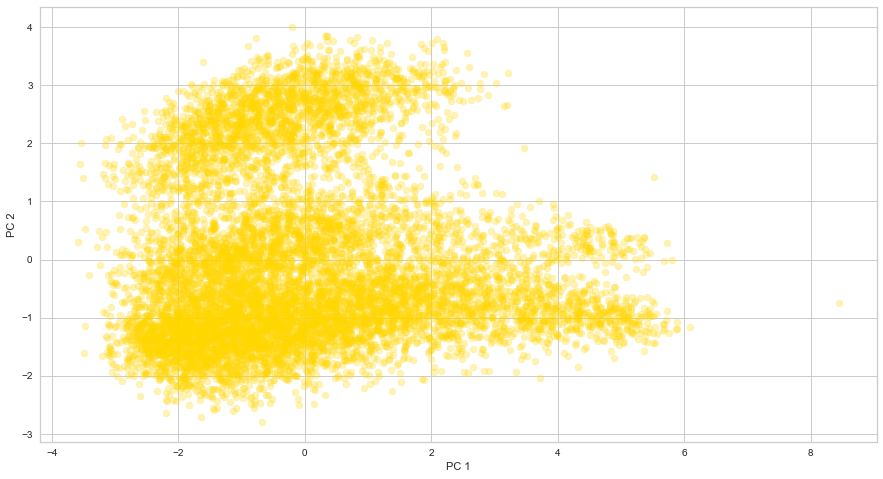

In [12]:
plt.figure(figsize=(15, 8))
plt.scatter(PCA_components['PC1'], PCA_components['PC2'], alpha=.3, color='gold')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.savefig('plot_variance_1_and_2')
plt.show()

In [17]:
sum(pca_reducer.explained_variance_ratio_)*100

95.49138696214852

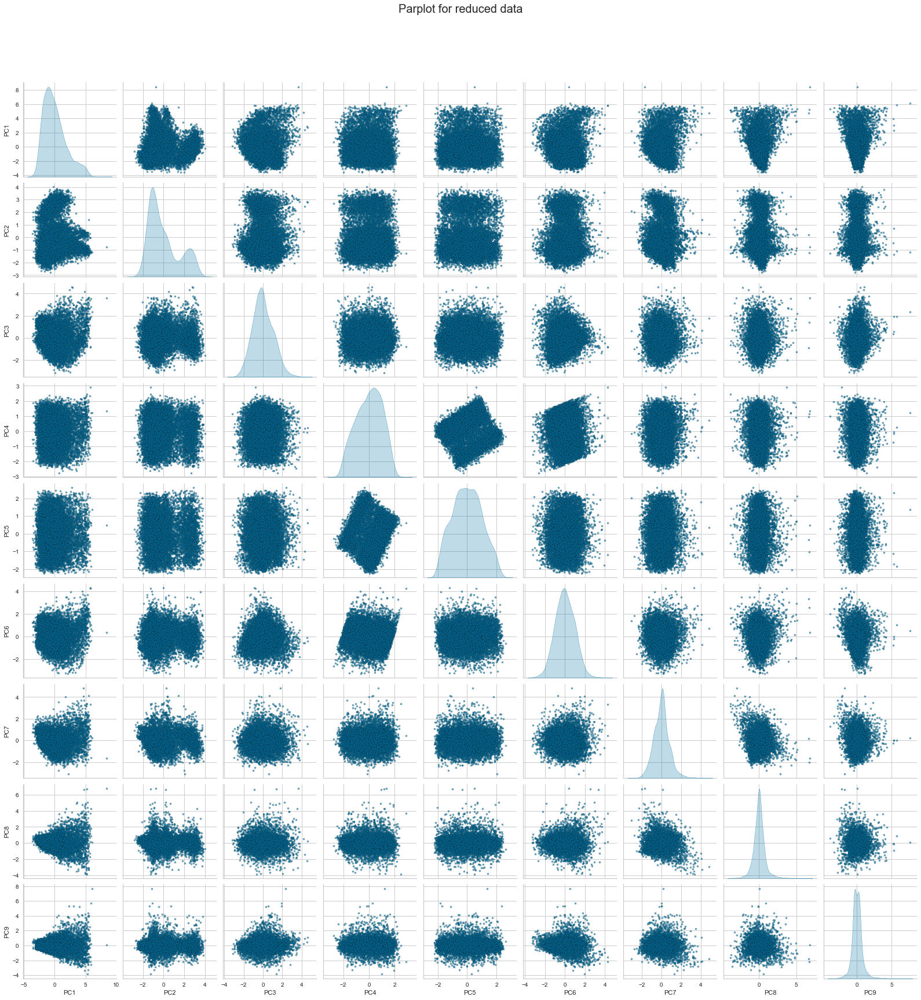

In [18]:
g = sns.pairplot(PCA_components, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'})
g.fig.suptitle('Parplot for reduced data', 
             size = 20, y=1.07);

## Métodos de avaliação do modelo K-means


## Elbow Method

A fundamental step for any unsupervised algorithm is to determine the optimal number of clusters into which the data may be clustered. The Elbow Method is one of the most popular methods to determine this optimal value of k.

In [13]:
from sklearn.cluster import KMeans

inert = []
for i in range(2, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(reduced_data)
    inert.append(kmeans.inertia_)

In [14]:
# use bigger plots
sns.set(rc={'figure.figsize':(11.7,8.27)})

C:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


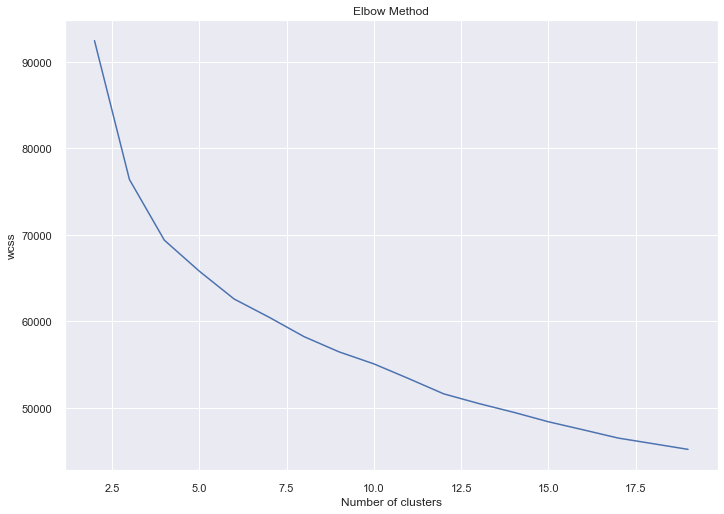

In [15]:
sns.lineplot(range(2,20), inert);
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.savefig('Elbow_Method')
plt.show()

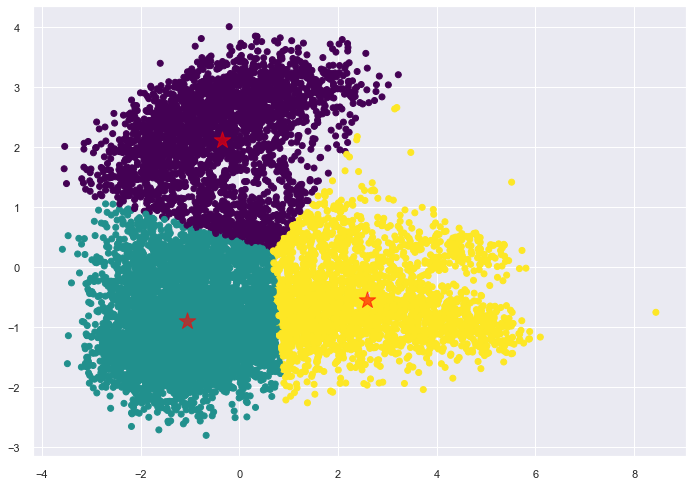

In [16]:
model = KMeans(n_clusters=3)
model.fit(PCA_components.iloc[:,:2])
cent = model.cluster_centers_

labels = model.predict(PCA_components.iloc[:,:2])
plt.scatter(PCA_components['PC1'], PCA_components['PC2'],  cmap='viridis_r', c=labels)
plt.scatter(cent[:, 0], cent[:, 1],c='red', marker='*', s=300, alpha=0.6, label='centers')
df_pca_9_km = PCA_components.assign(label = labels)
plt.savefig('k-means')

plt.show()

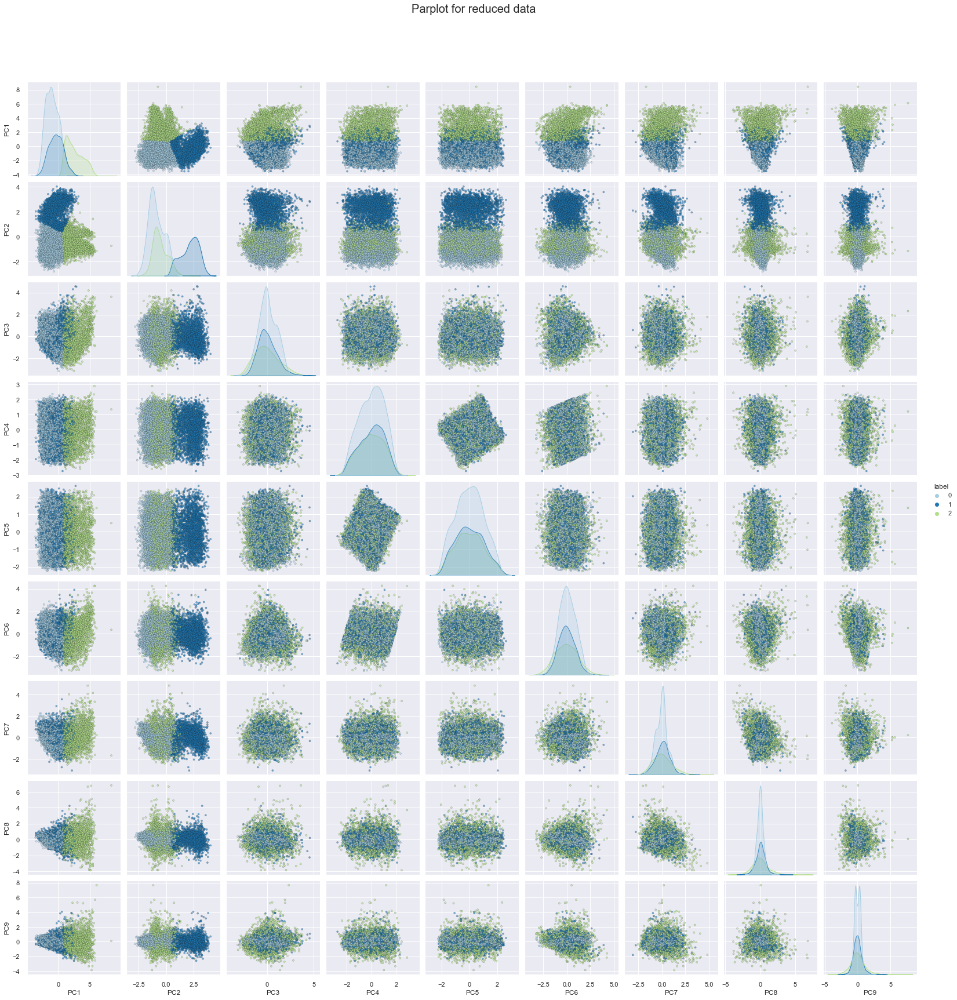

In [23]:
g = sns.pairplot(data = df_pca_9_km, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

## Silhouette Analysis:

- A pontuação de silhueta para um conjunto de pontos de dados de amostra é usada para medir quão densos e bem separados são os clusters.
- A pontuação da silhueta leva em consideração a distância intracluster entre a amostra e outros pontos de dados dentro do mesmo cluster ( a ) e a distância intercluster entre a amostra e o próximo cluster mais próximo ( b ).
- A pontuação da silhueta está dentro do intervalo [-1, 1].
- A pontuação de silhueta de 1 significa que os clusters são muito densos e bem separados. A pontuação de 0 significa que os clusters estão sobrepostos. A pontuação inferior a 0 significa que os dados pertencentes a clusters podem estar errados/incorretos.
- Os gráficos de silhueta podem ser usados para selecionar o valor ideal do K (nº de cluster) no agrupamento K-means.
- Os aspectos a serem observados nos gráficos de silhueta são pontuações de cluster abaixo da pontuação média de silhueta, grandes flutuações no tamanho dos clusters e também a espessura do gráfico de silhueta.

more information: https://towardsdatascience.com/k-means-clustering-algorithm-applications-evaluation-methods-and-drawbacks-aa03e644b48a

In [24]:
#Calculating the silhoutte coefficient
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

for n_cluster in range(2, 11):
    kmeans = KMeans(n_clusters=n_cluster).fit(reduced_data)
    label = kmeans.labels_
    sil_coeff = silhouette_score(reduced_data, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.23108001082741492
For n_clusters=3, The Silhouette Coefficient is 0.21416148132186552
For n_clusters=4, The Silhouette Coefficient is 0.17643733574840245
For n_clusters=5, The Silhouette Coefficient is 0.1463102044038626
For n_clusters=6, The Silhouette Coefficient is 0.13955849736936313
For n_clusters=7, The Silhouette Coefficient is 0.13925283578231334
For n_clusters=8, The Silhouette Coefficient is 0.13252072192352846
For n_clusters=9, The Silhouette Coefficient is 0.12656172897253365
For n_clusters=10, The Silhouette Coefficient is 0.12904715412404727


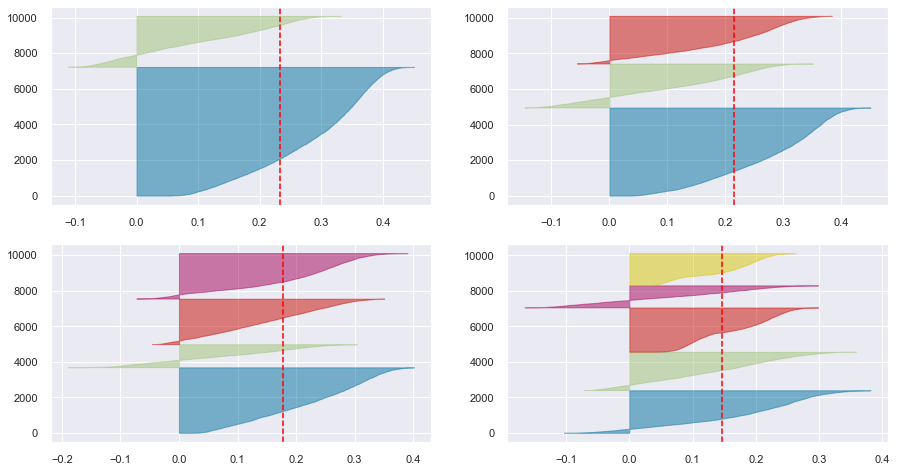

In [25]:
from yellowbrick.cluster import SilhouetteVisualizer

fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(reduced_data)

## Avaliando o K-means com 4 Cluster

In [17]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(reduced_data)
clust_labels = kmeans.predict(reduced_data)
cent = kmeans.cluster_centers_
kmeans = pd.DataFrame(clust_labels)

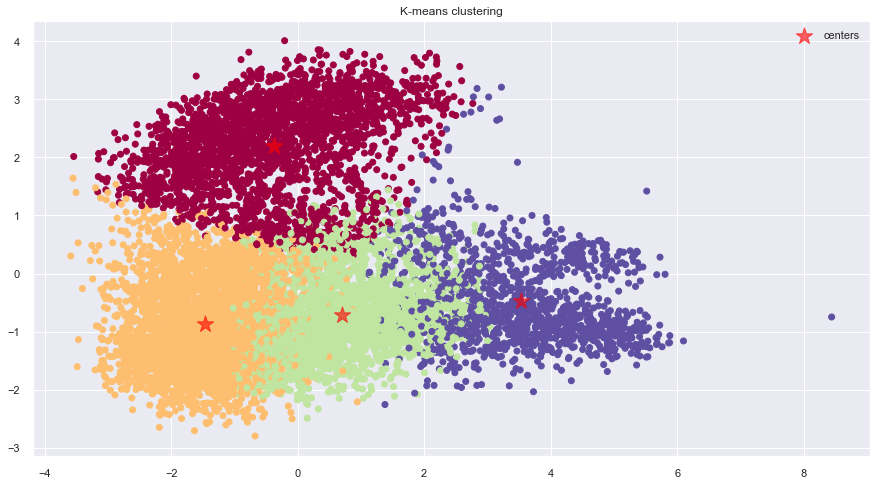

In [20]:
plt.figure(figsize=(15, 8))
# K-means clustering
plt.scatter(reduced_data[0],reduced_data[1],
                     c=kmeans[0], cmap='Spectral')
plt.scatter(cent[:, 0], cent[:, 1],c='red', marker='*', s=300, alpha=0.6, label='centers')
plt.legend(loc='best')
plt.title('K-means clustering')
plt.xlabel('')
plt.ylabel('')
plt.savefig('kmeans4')
plt.show()

## Mean Shift

In [35]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import MeanShift , estimate_bandwidth
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture

In [36]:
bandwidth = estimate_bandwidth(reduced_data.iloc[:,:6], quantile=0.04, n_samples=500)
ms = MeanShift(bandwidth=bandwidth,bin_seeding=True)
ms.fit(reduced_data.iloc[:,:6])
ms_centers = ms.cluster_centers_
ms_labels =  ms.labels_
print("number of estimated clusters : %d" % len(np.unique(ms_labels)))
df_pca_9_km = PCA_components.assign(label = ms_labels)

number of estimated clusters : 3


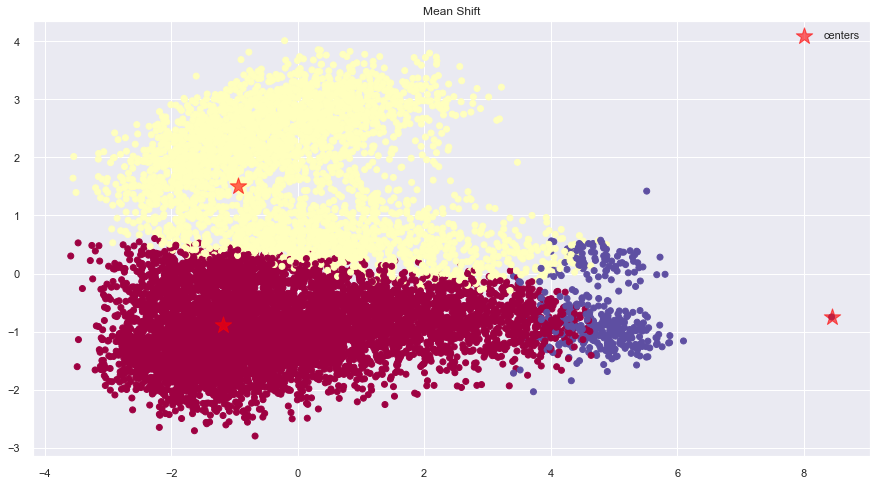

In [38]:
plt.figure(figsize=(15, 8))
# K-means clustering
plt.scatter(reduced_data[0],reduced_data[1],
                     c=ms_labels, cmap='Spectral')
plt.scatter(ms_centers[:, 0], ms_centers[:, 1],c='red', marker='*', s=300, alpha=0.6, label='centers')
plt.legend(loc='best')
plt.title('Mean Shift')
plt.xlabel('')
plt.ylabel('')
plt.savefig('mss')
plt.show()

<Figure size 1080x576 with 0 Axes>

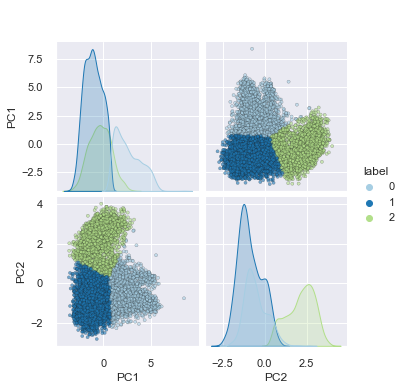

In [26]:
plt.figure(figsize=(15, 8))
g = sns.pairplot(data =df_pca_9_km[['PC1', 'PC2','label']] , diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle(' ', 
                size = 30, y=1.07);

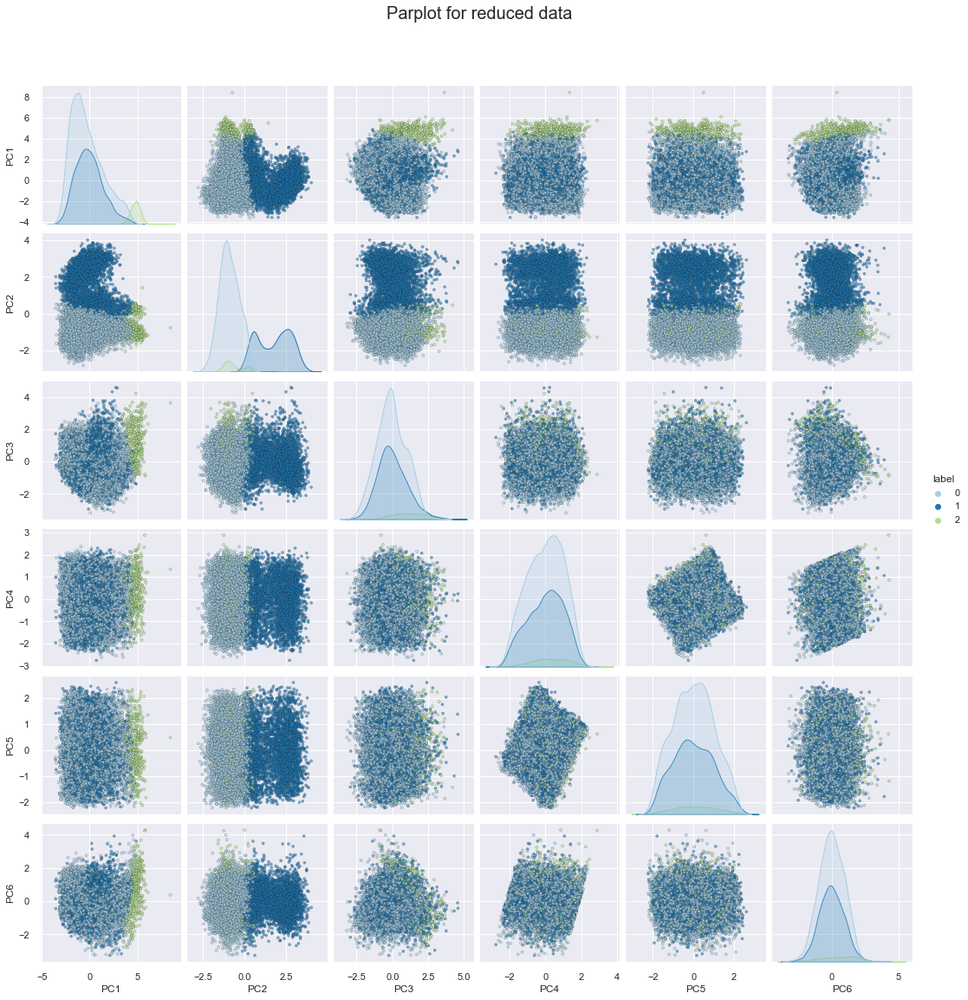

In [30]:
g = sns.pairplot(data =df_pca_9_km[['PC1', 'PC2','PC3','PC4','PC5','PC6', 'label']] , diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [31]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data, ms_labels))

Silhouette Coefficient: 0.171


### Agglomerative Clustering

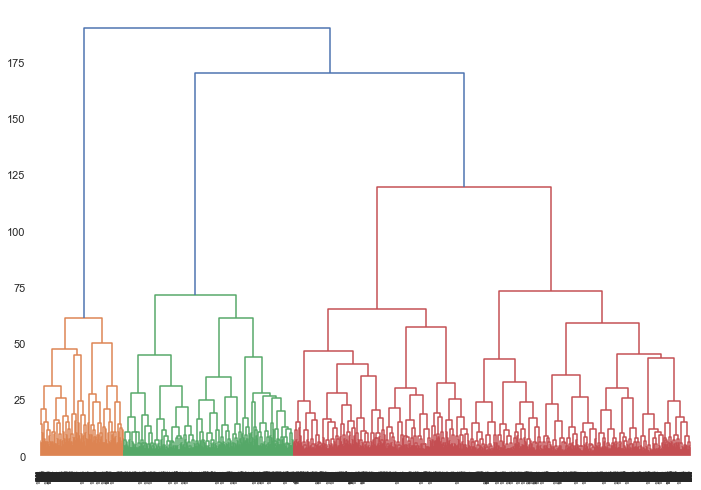

In [32]:
dendrogram = sch.dendrogram(sch.linkage(reduced_data, method='ward'))

In [33]:
ac = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
ac.fit(reduced_data)
ac_labels =  ac.labels_
df_pca_9_agc = PCA_components.assign(label = ac_labels)

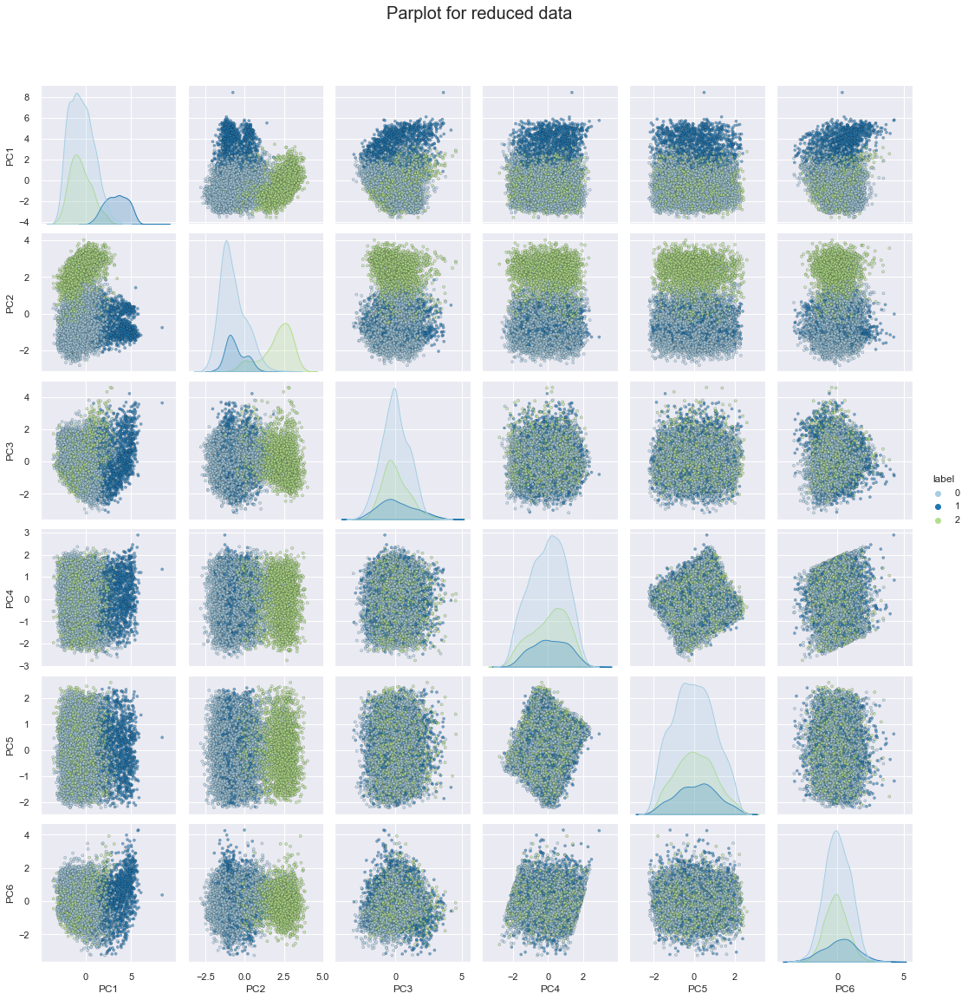

In [34]:
g = sns.pairplot(data =df_pca_9_agc[['PC1', 'PC2','PC3','PC4','PC5','PC6', 'label']] , diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [35]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data, ac_labels))

Silhouette Coefficient: 0.178


## Model DBSCAN -  Density-Based Spatial Clustering of Applications with Noise

O DBSCAN é um dos métodos de clustering mais usados porque os clusters encontrados pelo DBSCAN podem ter qualquer formato, o que pode lidar com alguns casos especiais que outros métodos não podem.


### Vantagens

- Primeiro, o DBSCAN não exige que os usuários especifiquem o número de clusters .
- Segundo, DBSCAN NÃO é sensível a valores discrepantes.
- Terceiro, os clusters formados pelo DBSCAN podem ter qualquer formato, o que o torna robusto a diferentes tipos de dados.

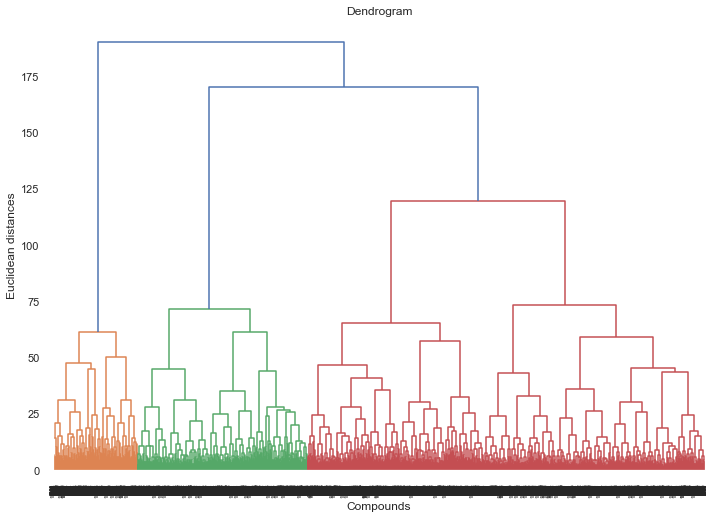

In [95]:
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(reduced_data, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Compounds')
plt.ylabel('Euclidean distances')
plt.show()

In [96]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.datasets import make_circles



In [219]:
#Create an instance of DBSCAN to create non spherical clusters based on data density
db = DBSCAN(eps=3, min_samples=4)

#fit to the dimentionality reduced dataset
db.fit(reduced_data)

#identify the clusters
clusters = db.labels_

#display metrics/sample
n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise_ = list(clusters).count(-1)

print('Cluster Predictions')
print('-------------------------------')
print("Number of clusters: %d" % n_clusters_)
print("Number of noise points: %d" % n_noise_)
print('Number of points per cluster:')
for i in range(n_clusters_):
    print('Cluster', i, ':', len(clusters[clusters==i]))

C:\anaconda\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Cluster Predictions
-------------------------------
Number of clusters: 3
Number of noise points: 7
Number of points per cluster:
Cluster 0 : 9922
Cluster 1 : 140
Cluster 2 : 5


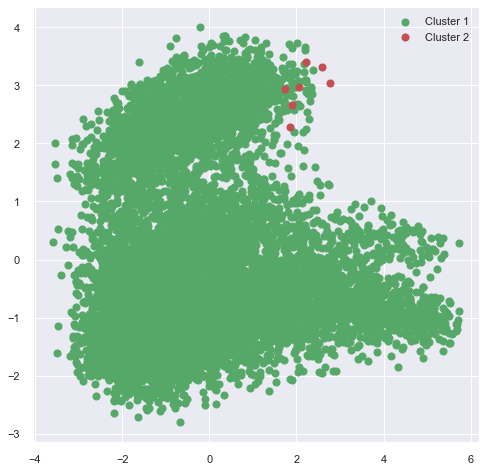

In [230]:
colors = ['g','r','b','y','burlywood','green', 'm', 'c']
plt.figure(figsize=(8,8))
for i in range(0 ,n_clusters_ - 1):
    plt.scatter(reduced_data.iloc[labels == i, 0], reduced_data.iloc[labels == i, 1], s = 50, c = colors[i], label = 'Cluster ' + str(i + 1))    
plt.legend()

### Gaussian Mixture Model


In [39]:
gmm = GaussianMixture(n_components=3, random_state=0)
gmm.fit(reduced_data)
gmm_labels =  gmm.predict(reduced_data)

df_pca_9_gmm = PCA_components.assign(label = gmm_labels)

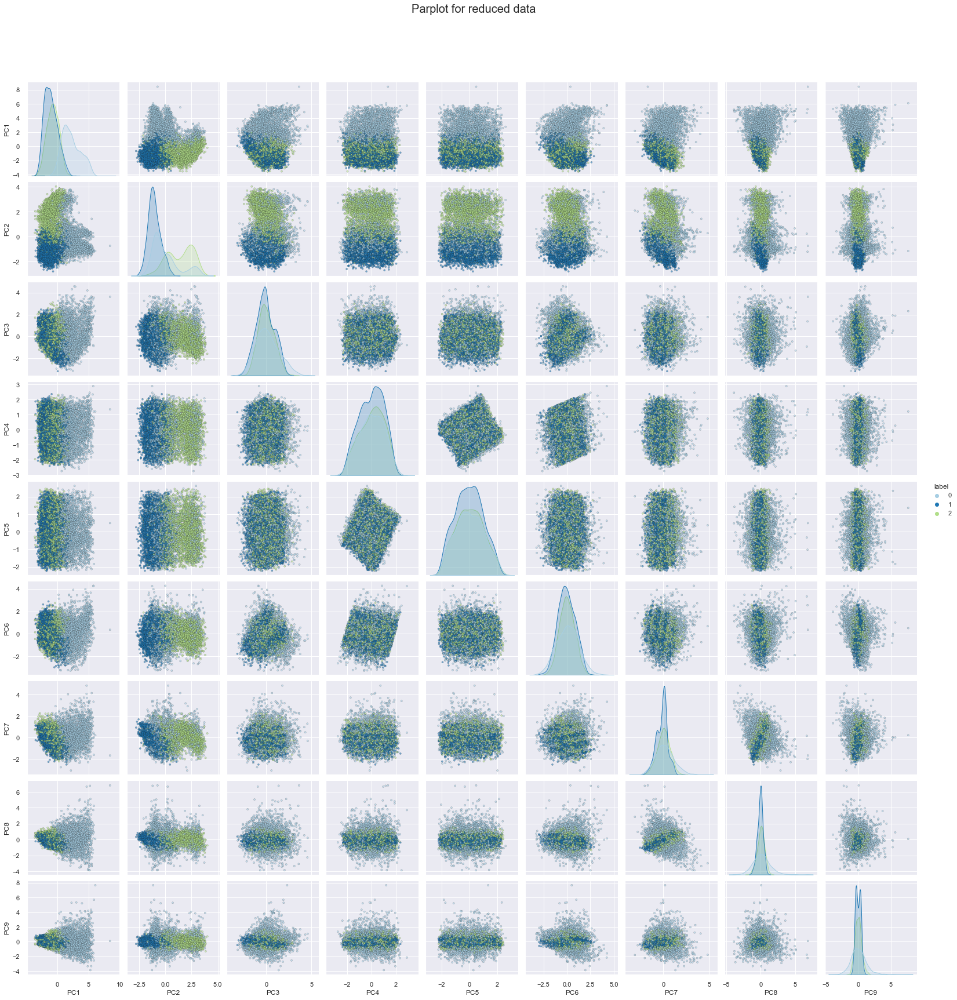

In [40]:
g = sns.pairplot(data = df_pca_9_gmm, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [41]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data, gmm_labels))

Silhouette Coefficient: 0.132


## Clustering com as variáveis do negócio

In [42]:
features2 = [ 'Customer Monetary Value','Premiums in LOB: Motor',
       'Premiums in LOB: Household', 'Premiums in LOB: Health',
       'Premiums in LOB:  Life', 'Premiums in LOB: Work Compensations']

In [43]:
# Selecting features
X2 = df_data.loc[:, features2].values

# Standardizing the features
X2 = StandardScaler().fit_transform(X2)

### PCA - Redução da dimensionalidade

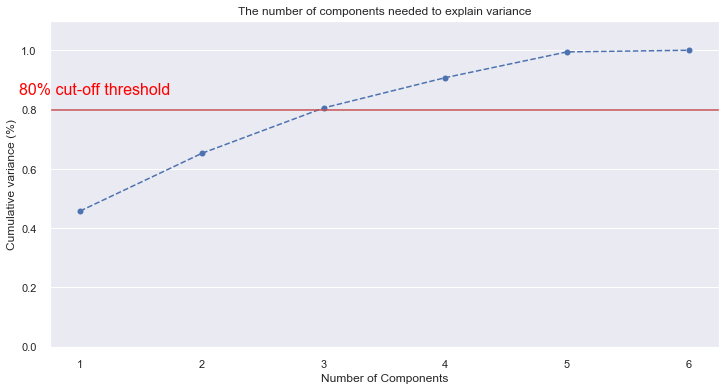

In [44]:
pca2 = PCA().fit(X2)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1,7 , step=1)
y = np.cumsum(pca2.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 7, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.80, color='r', linestyle='-')
plt.text(0.5, 0.85, '80% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

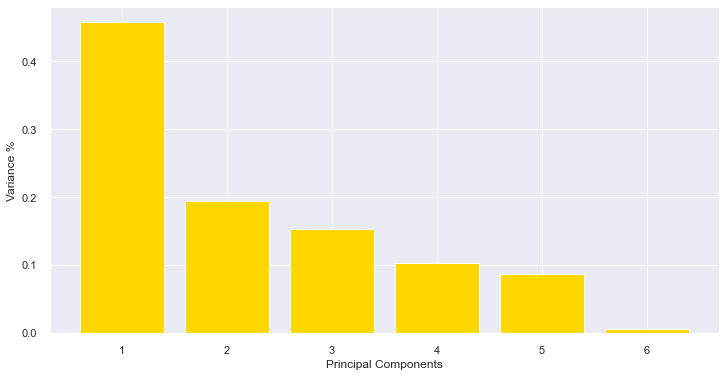

In [45]:
# Plotting the variances for each Principal Components
PC2 = range(1, pca2.n_components_+1)
plt.bar(PC2, pca2.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC2)
plt.show()

In [46]:
pca2_reducer = PCA(n_components=3)
reduced_data2 = pca2_reducer.fit_transform(X2)


# Putting components in a dataframe for later
reduced_data2 = pd.DataFrame(data = reduced_data2, columns=(["PC1","PC2", "PC3"]))
PCA_components2 = pd.DataFrame(data = reduced_data2, columns=(["PC1","PC2", "PC3"]))

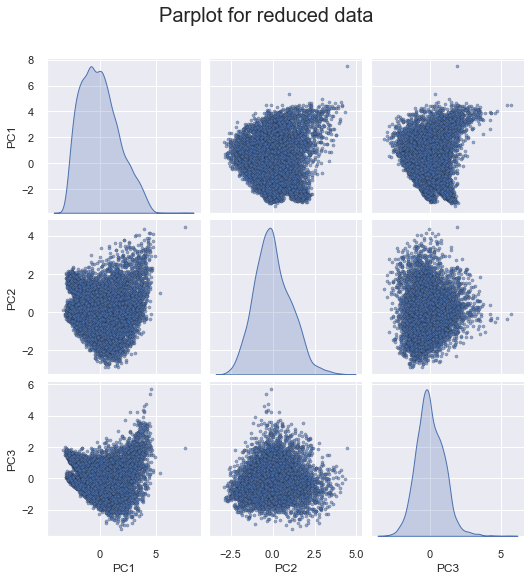

In [47]:
g = sns.pairplot(reduced_data2, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'})
g.fig.suptitle('Parplot for reduced data', 
             size = 20, y=1.07);

### K-Means

#### Elbow Method

C:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


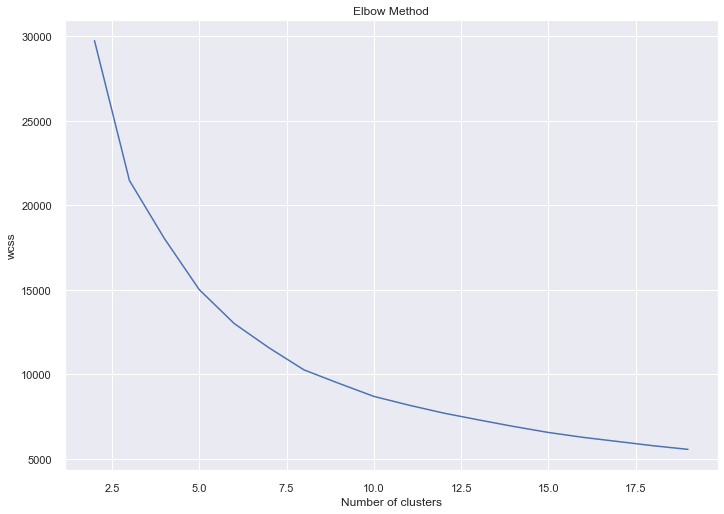

In [48]:
inert = []
for i in range(2, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(reduced_data2)
    inert.append(kmeans.inertia_)
    
# use bigger plots
sns.set(rc={'figure.figsize':(11.7,8.27)})


sns.lineplot(range(2,20), inert);
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.show()

#### Silhouette Analysis

In [49]:
for n_cluster in range(2, 11):
    kmeans = KMeans(n_clusters=n_cluster).fit(reduced_data2)
    label = kmeans.labels_
    sil_coeff = silhouette_score(reduced_data2, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.3501650475768867
For n_clusters=3, The Silhouette Coefficient is 0.3284814258709351
For n_clusters=4, The Silhouette Coefficient is 0.32059379214665745
For n_clusters=5, The Silhouette Coefficient is 0.3327992812525598
For n_clusters=6, The Silhouette Coefficient is 0.30661081087065295
For n_clusters=7, The Silhouette Coefficient is 0.304765610093991
For n_clusters=8, The Silhouette Coefficient is 0.3119350611054577
For n_clusters=9, The Silhouette Coefficient is 0.3115675566068445
For n_clusters=10, The Silhouette Coefficient is 0.31426746525881716


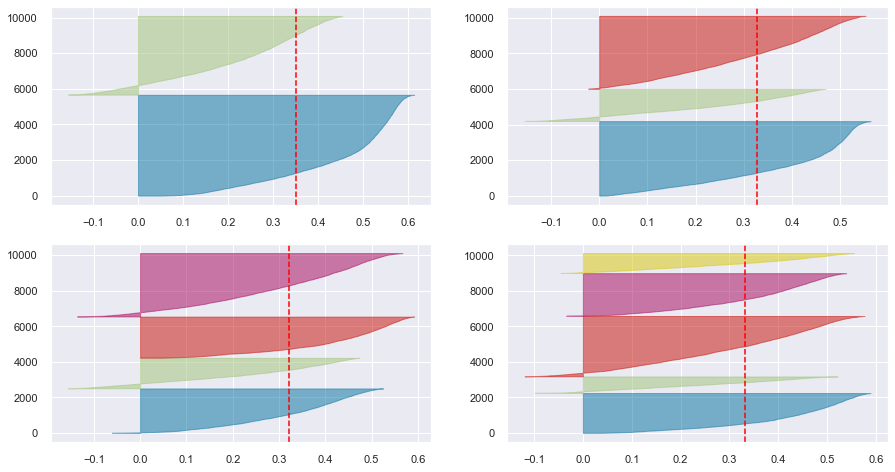

In [50]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(reduced_data2)

##### K-Means 3 clusters

In [51]:
km = KMeans(n_clusters=3, init = 'k-means++', random_state = 42)
km.fit(reduced_data2)
km_labels = km.predict(reduced_data2)
cent = km.cluster_centers_
df_pca_km = PCA_components2.assign(label = km_labels)

Text(0, 0.5, 'principal component 2')

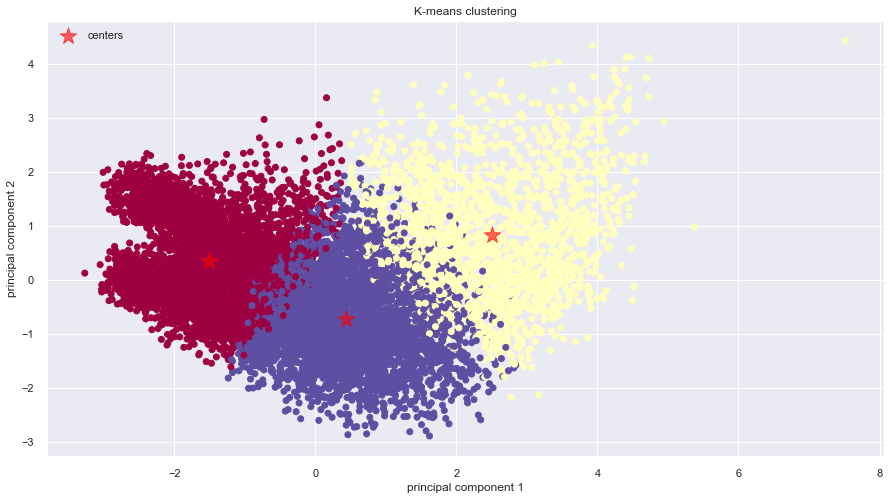

In [52]:
plt.figure(figsize=(15, 8))
# K-means clustering
plt.scatter(df_pca_km['PC1'],df_pca_km['PC2'],
                     c=km_labels, cmap='Spectral')
plt.scatter(cent[:, 0], cent[:, 1],c='red', marker='*', s=300, alpha=0.6, label='centers')
plt.legend(loc='best')
plt.title('K-means clustering')
plt.xlabel('principal component 1')
plt.ylabel('principal component 2')

##### K-Means 5 clusters

In [53]:
km5 = KMeans(n_clusters=5, init = 'k-means++', random_state = 42)
km5.fit(reduced_data2)
km5_labels = km5.predict(reduced_data2)
cent = km5.cluster_centers_
df_pca_km5 = PCA_components2.assign(label = km5_labels)

Text(0, 0.5, 'principal component 2')

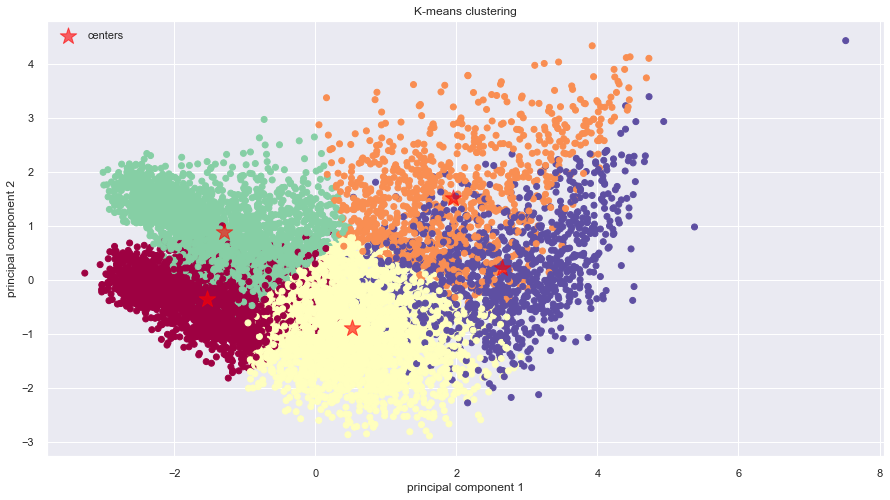

In [54]:
plt.figure(figsize=(15, 8))
# K-means clustering
plt.scatter(df_pca_km5['PC1'],df_pca_km5['PC2'],
                     c=km5_labels, cmap='Spectral')
plt.scatter(cent[:, 0], cent[:, 1],c='red', marker='*', s=300, alpha=0.6, label='centers')
plt.legend(loc='best')
plt.title('K-means clustering')
plt.xlabel('principal component 1')
plt.ylabel('principal component 2')

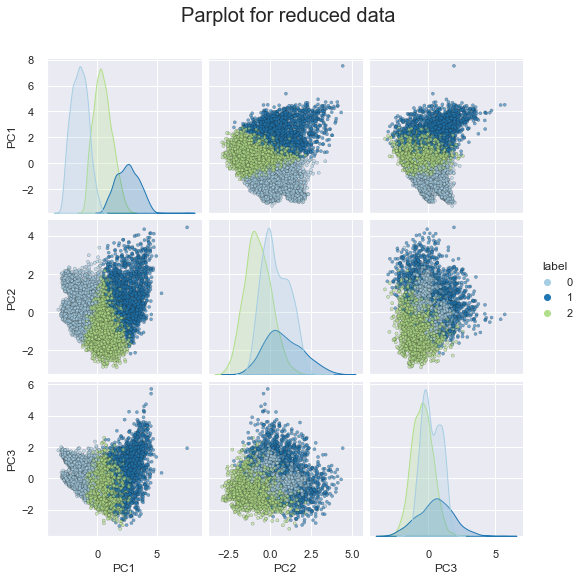

In [55]:
g = sns.pairplot(data = df_pca_km, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [56]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data2, km_labels))

Silhouette Coefficient: 0.328


### Mean Shift

In [57]:
bandwidth = estimate_bandwidth(reduced_data2, quantile=0.07, n_samples=500)
ms = MeanShift(bandwidth=bandwidth,bin_seeding=True)
ms.fit(reduced_data2)
ms_centers = ms.cluster_centers_
ms_labels =  ms.labels_
print("number of estimated clusters : %d" % len(np.unique(ms_labels)))
df_ms = PCA_components2.assign(label = ms_labels)

number of estimated clusters : 4


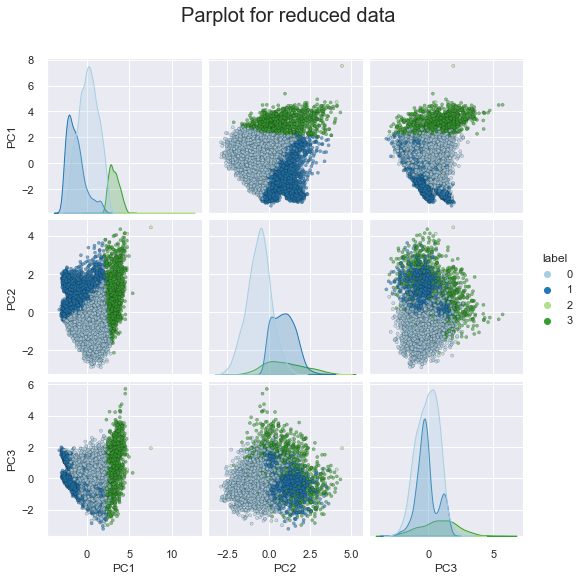

In [58]:
g = sns.pairplot(data = df_ms, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [59]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data2, ms_labels))

Silhouette Coefficient: 0.254


### Spectral Clustering

In [60]:
sc = SpectralClustering(n_clusters=3, assign_labels='discretize', random_state=0)
sc.fit(reduced_data2)
sc_labels =  sc.labels_
df_sc = PCA_components2.assign(label = sc_labels)

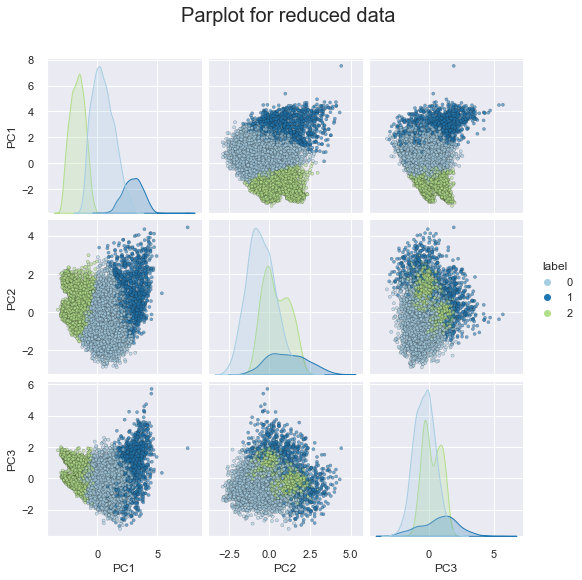

In [61]:
g = sns.pairplot(data = df_sc, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [62]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data2, sc_labels))

Silhouette Coefficient: 0.323


### Agglomerative Clustering

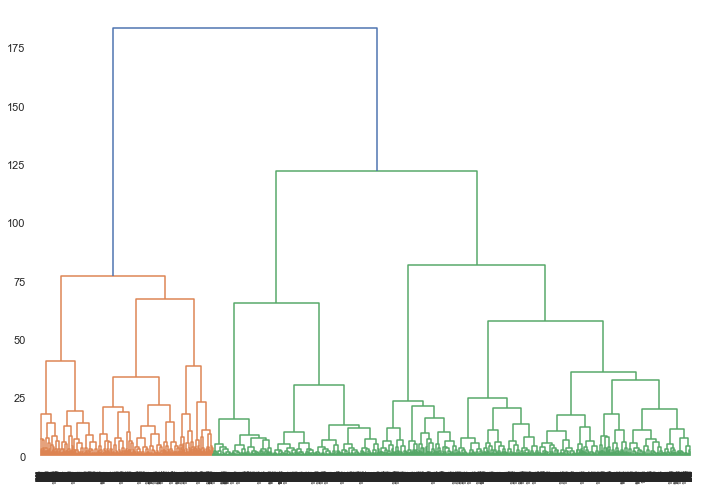

In [63]:
dendrogram = sch.dendrogram(sch.linkage(reduced_data2, method='ward'))

In [64]:
ac = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
ac.fit(reduced_data2)
ac_labels =  ac.labels_
df_pca_ac = PCA_components2.assign(label = ac_labels)

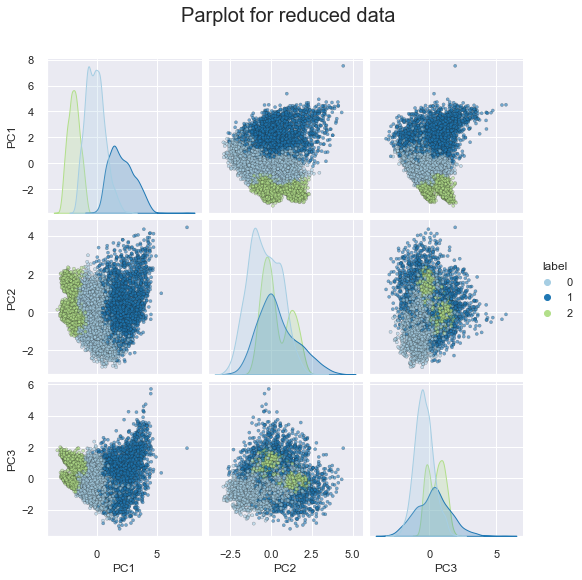

In [65]:
g = sns.pairplot(data = df_pca_ac, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [66]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data2, ac_labels))

Silhouette Coefficient: 0.249


### Gaussian Mixture Model

In [67]:
gmm = GaussianMixture(n_components=3, random_state=0)
gmm.fit(reduced_data2)
gmm2_labels =  gmm.predict(reduced_data2)
df_gmm = PCA_components2.assign(label = gmm2_labels)

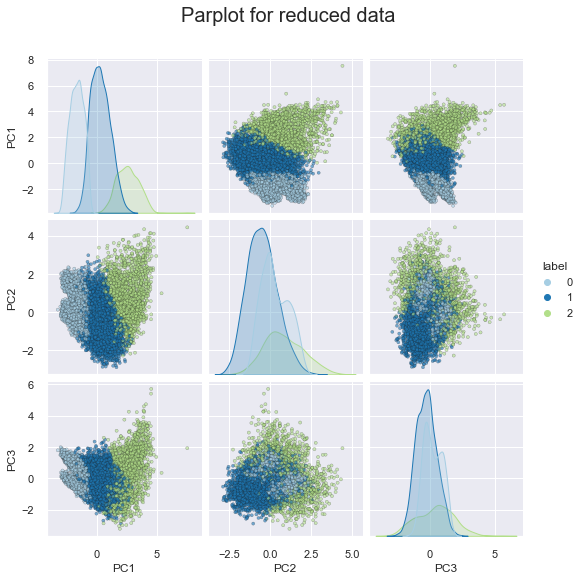

In [68]:
g = sns.pairplot(data = df_gmm, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [69]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data2, gmm2_labels))

Silhouette Coefficient: 0.284


## Segmentação - Perfis do cliente

In [70]:
features3 = ['Customer Age', 'Educational Degree', 'Gross Monthly Salary', 'Geographic Living Area',
            'Children', 'Customer Monetary Value']

In [71]:
# Selecting features
X3 = df_data.loc[:, features3].values

# Standardizing the features
X3 = StandardScaler().fit_transform(X3)

### PCA - Redução da dimensionalidade

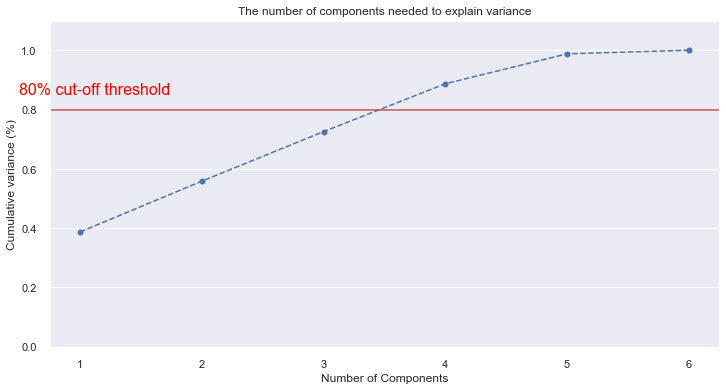

In [72]:
pca3 = PCA().fit(X3)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1,7 , step=1)
y = np.cumsum(pca3.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 7, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.80, color='r', linestyle='-')
plt.text(0.5, 0.85, '80% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

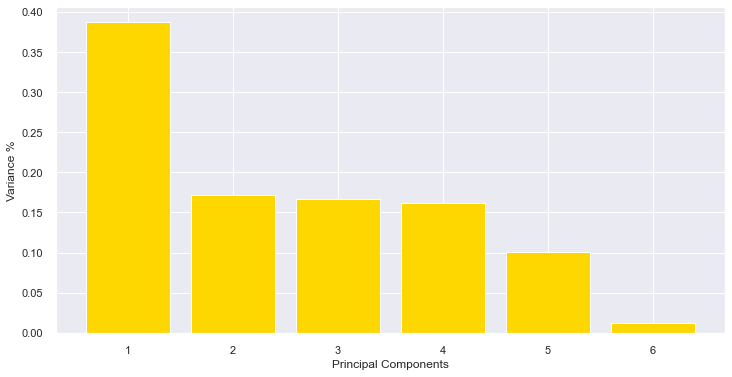

In [73]:
# Plotting the variances for each Principal Components
PC3 = range(1, pca3.n_components_+1)
plt.bar(PC3, pca3.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC3)
plt.show()

In [74]:
pca3_reducer = PCA(n_components=4)
reduced_data3 = pca3_reducer.fit_transform(X3)


# Putting components in a dataframe for later
reduced_data3 = pd.DataFrame(data = reduced_data3, columns=(["PC1","PC2", "PC3", "PC4"]))
PCA_components3 = pd.DataFrame(data = reduced_data3, columns=(["PC1","PC2", "PC3", "PC4"]))

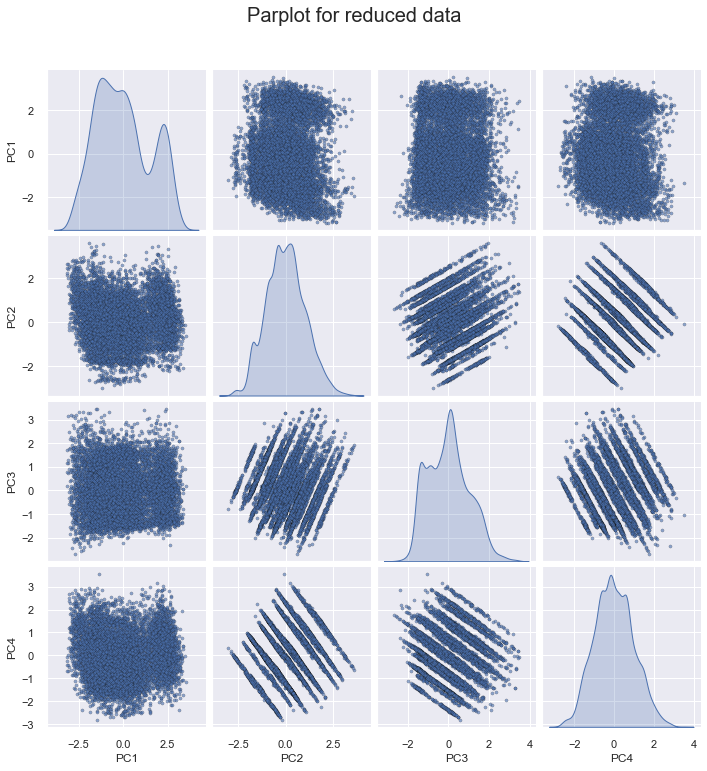

In [75]:
g = sns.pairplot(reduced_data3, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'})
g.fig.suptitle('Parplot for reduced data', 
             size = 20, y=1.07);

### K-Means

#### Elbow Method

C:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


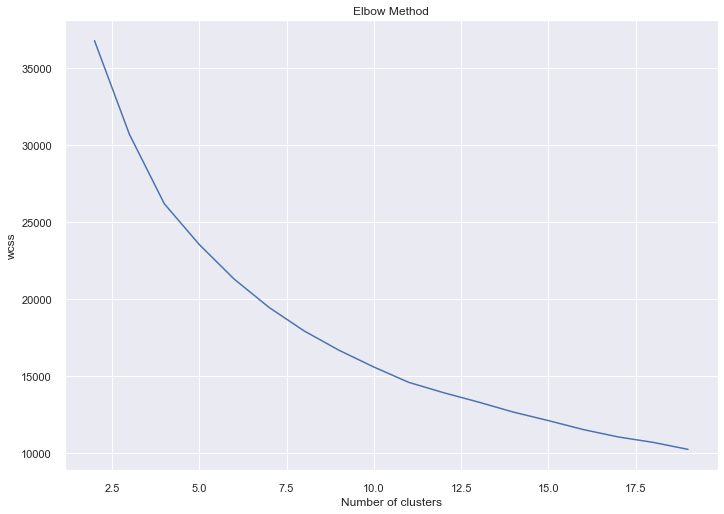

In [76]:
inert = []
for i in range(2, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(reduced_data3)
    inert.append(kmeans.inertia_)
    
# use bigger plots
sns.set(rc={'figure.figsize':(11.7,8.27)})


sns.lineplot(range(2,20), inert);
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.show()

#### Silhouette Analysis

In [77]:
for n_cluster in range(2, 11):
    kmeans = KMeans(n_clusters=n_cluster).fit(reduced_data3)
    label = kmeans.labels_
    sil_coeff = silhouette_score(reduced_data3, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.2845866521703749
For n_clusters=3, The Silhouette Coefficient is 0.25461141430361267
For n_clusters=4, The Silhouette Coefficient is 0.2467988635162115
For n_clusters=5, The Silhouette Coefficient is 0.24037483558652953
For n_clusters=6, The Silhouette Coefficient is 0.23652569850765895
For n_clusters=7, The Silhouette Coefficient is 0.2418891141563419
For n_clusters=8, The Silhouette Coefficient is 0.25162825915649706
For n_clusters=9, The Silhouette Coefficient is 0.2559769680352527
For n_clusters=10, The Silhouette Coefficient is 0.2531347825834039


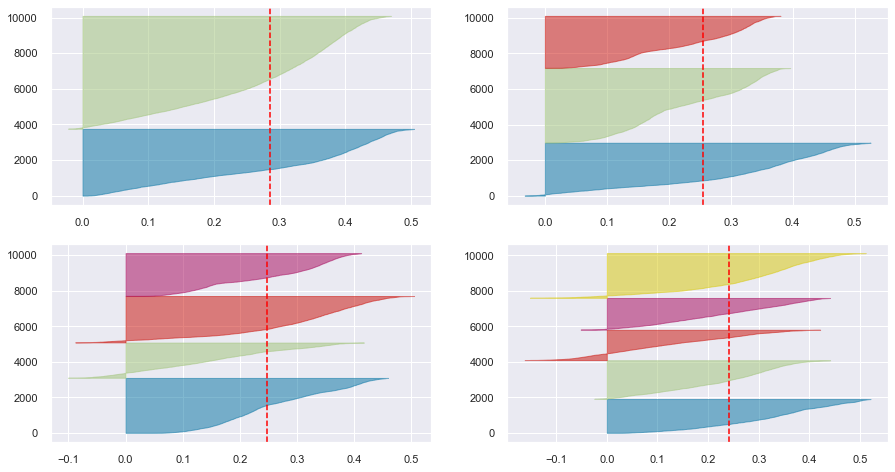

In [78]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(reduced_data3)

##### K-Means 3 clusters

In [79]:
km = KMeans(n_clusters=3, init = 'k-means++', random_state = 42)
km.fit(reduced_data3)
km_labels = km.predict(reduced_data3)
cent = km.cluster_centers_
df_pca_km = PCA_components3.assign(label = km_labels)

Text(0, 0.5, 'principal component 2')

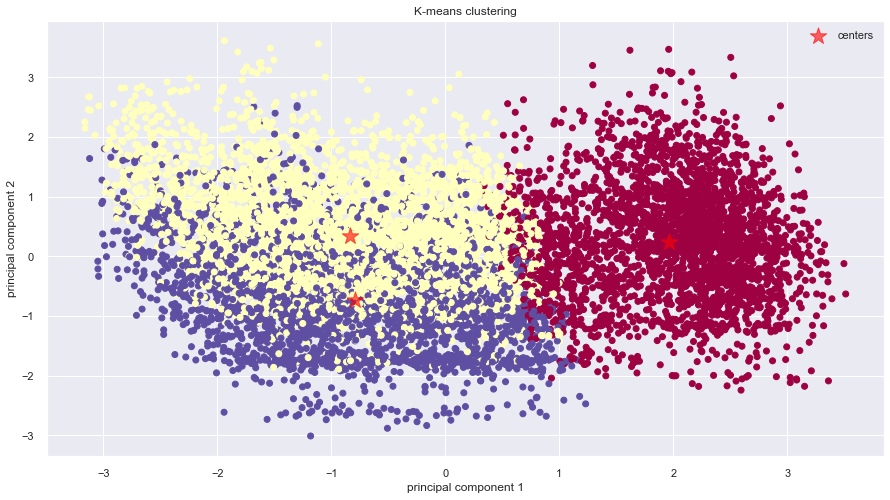

In [80]:
plt.figure(figsize=(15, 8))
# K-means clustering
plt.scatter(df_pca_km['PC1'],df_pca_km['PC2'],
                     c=km_labels, cmap='Spectral')
plt.scatter(cent[:, 0], cent[:, 1],c='red', marker='*', s=300, alpha=0.6, label='centers')
plt.legend(loc='best')
plt.title('K-means clustering')
plt.xlabel('principal component 1')
plt.ylabel('principal component 2')

##### K-Means 4 clusters

In [81]:
km4 = KMeans(n_clusters=4, init = 'k-means++', random_state = 42)
km4.fit(reduced_data3)
km4_labels = km4.predict(reduced_data3)
cent = km4.cluster_centers_
df_pca_km4 = PCA_components3.assign(label = km4_labels)

Text(0, 0.5, 'principal component 2')

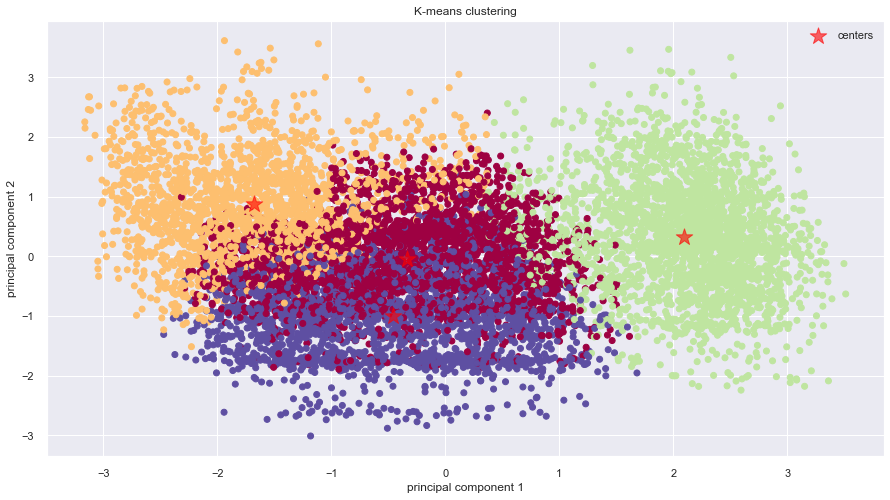

In [82]:
plt.figure(figsize=(15, 8))
# K-means clustering
plt.scatter(df_pca_km4['PC1'],df_pca_km4['PC2'],
                     c=km4_labels, cmap='Spectral')
plt.scatter(cent[:, 0], cent[:, 1],c='red', marker='*', s=300, alpha=0.6, label='centers')
plt.legend(loc='best')
plt.title('K-means clustering')
plt.xlabel('principal component 1')
plt.ylabel('principal component 2')

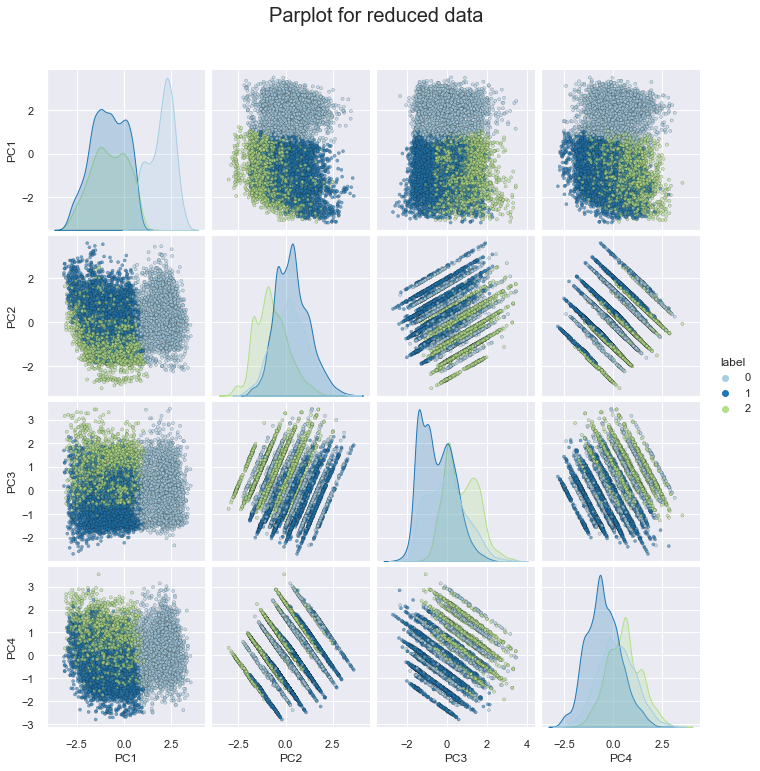

In [83]:
g = sns.pairplot(data = df_pca_km, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [84]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data3, km_labels))

Silhouette Coefficient: 0.255


### Mean Shift

In [85]:
bandwidth = estimate_bandwidth(reduced_data3, quantile=0.065, n_samples=500)
ms = MeanShift(bandwidth=bandwidth,bin_seeding=True)
ms.fit(reduced_data3)
ms_centers = ms.cluster_centers_
ms_labels =  ms.labels_
print("number of estimated clusters : %d" % len(np.unique(ms_labels)))
df_ms = PCA_components3.assign(label = ms_labels)

number of estimated clusters : 3


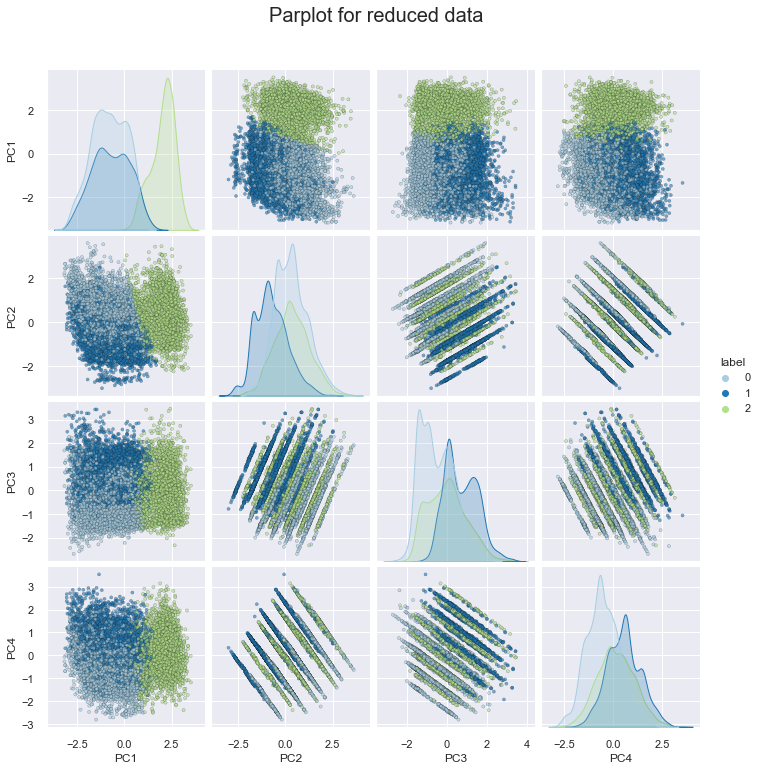

In [86]:
g = sns.pairplot(data = df_ms, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [87]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data3, ms_labels))

Silhouette Coefficient: 0.254


### Agglomerative Clustering

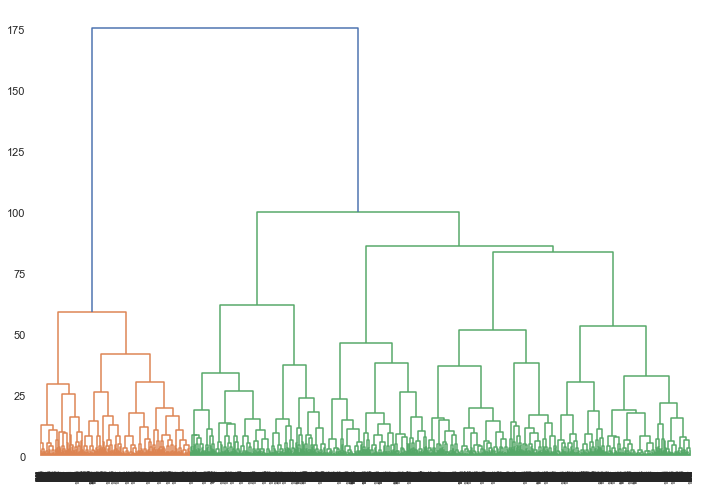

In [88]:
dendrogram = sch.dendrogram(sch.linkage(reduced_data3, method='ward'))

In [89]:
ac = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
ac.fit(reduced_data3)
ac_labels =  ac.labels_
df_pca_ac = PCA_components3.assign(label = ac_labels)

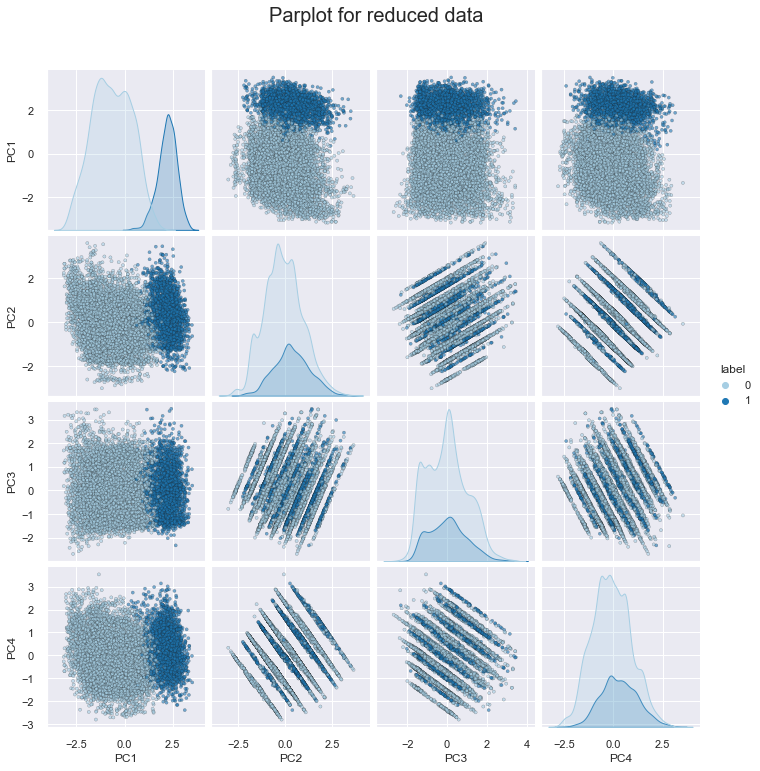

In [90]:
g = sns.pairplot(data = df_pca_ac, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [91]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data3, ac_labels))

Silhouette Coefficient: 0.302


### Gaussian Mixture Model

In [92]:
gmm = GaussianMixture(n_components=3, random_state=0)
gmm.fit(reduced_data3)
gmm_labels =  gmm.predict(reduced_data3)
df_gmm = PCA_components3.assign(label = gmm_labels)

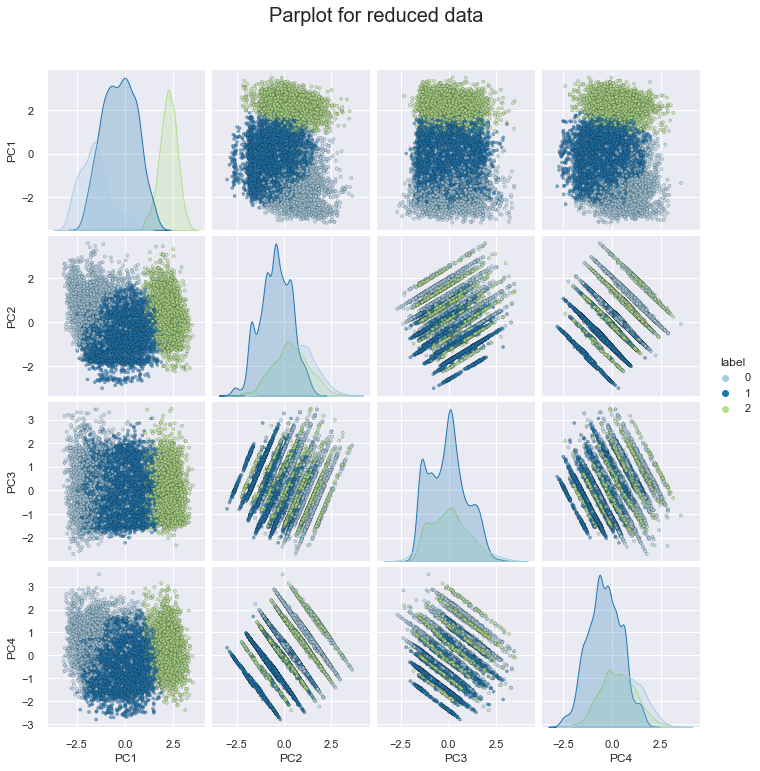

In [93]:
g = sns.pairplot(data = df_gmm, diag_kind="kde",
                 plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'}, hue ='label' , palette = 'Paired')
g.fig.suptitle('Parplot for reduced data', 
                size = 20, y=1.07);

In [94]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(reduced_data3, gmm_labels))

Silhouette Coefficient: 0.228
